# Notebook for differential abundance testing on single-cell data for COPD project

- **Developed by:** Anna Maguza
- **Institute of Computational Biology - Computational Health Department - Helmholtz Munich**
- 27th March 2022

### Import packages

In [1]:
import scanpy as sc
import numpy as np

In [2]:
import matplotlib.pyplot as plt

In [3]:
import milopy
import milopy.core as milo 
import milopy.plot as milopl 
import milopy.utils    

In [4]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### Setup Cells

In [5]:
%matplotlib inline

In [6]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.3.5 scikit-learn==1.2.2 statsmodels==0.13.5 pynndescent==0.5.8


#### Upload Data

In [7]:
input_data = '/Users/anna.maguza/Desktop/Data/COPD_project/Marburg_All_ctl230404_leiden_states.raw.h5ad'
output_data = '/Users/anna.maguza/Desktop/Data/COPD_project/Marburg_All_ctl230404_leiden_states_output.raw.h5ad'

In [8]:
adata = sc.read_h5ad(input_data)

In [9]:
# Merge column donor and column group into new column sample 
adata.obs["sample"] = adata.obs["donor"].astype(str) + "_" + adata.obs["group"].astype(str)

In [10]:
adata_raw = adata.copy()

In [11]:
X_is_raw(adata)

True

### Calculate UMAP

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


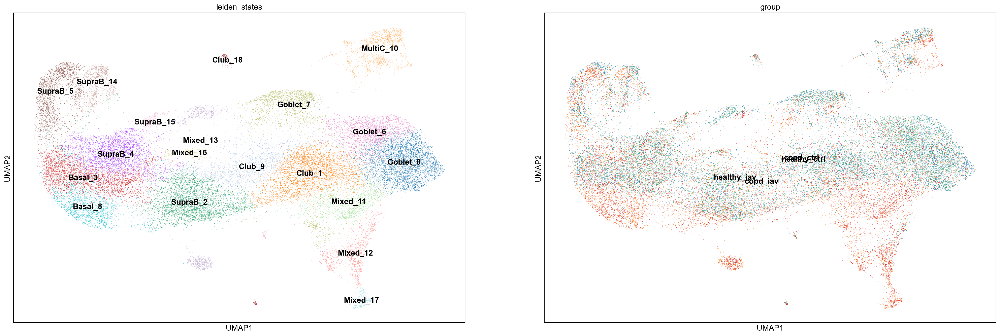

In [12]:
sc.set_figure_params(figsize=(15, 10),dpi=100)
sc.pl.umap(adata, color=["leiden_states", 'group'], legend_loc="on data");

# Healthy control vs. COPD

In [13]:
adata = adata_raw.copy()

In [14]:
# Filter only healthy_ctrl and COPD_ctrl cells
adata = adata[adata.obs['group'].isin(['healthy_ctrl', 'copd_ctrl'])]

In [15]:
adata.obs['group'].value_counts()

copd_ctrl       26261
healthy_ctrl    23667
Name: group, dtype: int64

In [16]:
# Calculate PCA 
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:23)


#### Build KNN graph

In [17]:
# Build a KNN graph
k = 20
d = 40

sc.pp.neighbors(adata, n_neighbors=k, n_pcs=d)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)


#### Construct neighbourhoods

In [18]:
#Assign cells to a set of representative neighbourhoods on the KNN graph
milo.make_nhoods(adata, prop=0.5)

In [19]:
adata.obsm["nhoods"]

<49928x12251 sparse matrix of type '<class 'numpy.float32'>'
	with 470559 stored elements in Compressed Sparse Row format>

In [20]:
adata[adata.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

,nhood_ixs_refined,nhood_kth_distance
763870-ST07_CSE_CTRL-V1,1,785.191895
192197-ST07_CSE_CTRL-V1,1,526.824768
550787-ST07_CSE_CTRL-V1,1,431.800385
580755-ST07_CSE_CTRL-V1,1,615.857422
191617-ST07_CSE_CTRL-V1,1,499.280304
...,...,...
8438090-CSE03_CTRL-V6,1,136.639984
13874320-CSE03_CTRL-V6,1,104.376030
13157829-CSE03_CTRL-V6,1,122.593597
12250460-CSE03_CTRL-V6,1,105.673431


(array([  6.,  10.,  25.,  71.,   0., 122., 204., 270., 337.,   0., 370.,
        434., 462., 529.,   0., 496., 535., 593., 546.,   0., 560., 526.,
        491.,   0., 465., 522., 419., 380.,   0., 370., 326., 295., 293.,
          0., 263., 267., 201., 213.,   0., 182., 154., 143.,   0., 128.,
        115.,  98.,  95.,   0.,  90.,  78.,  56.,  68.,   0.,  44.,  43.,
         47.,  42.,   0.,  34.,  28.,  23.,   0.,  23.,  19.,  15.,  21.,
          0.,  16.,  11.,   5.,   6.,   0.,  10.,   3.,   5.,   7.,   0.,
          5.,   5.,   4.,   0.,   2.,   5.,   3.,   0.,   0.,   2.,   2.,
          3.,   2.,   0.,   1.,   1.,   2.,   2.,   0.,   0.,   0.,   0.,
          2.]),
 array([19.        , 19.79000092, 20.57999992, 21.37000084, 22.15999985,
        22.95000076, 23.73999977, 24.53000069, 25.31999969, 26.11000061,
        26.89999962, 27.69000053, 28.47999954, 29.27000046, 30.05999947,
        30.85000038, 31.63999939, 32.43000031, 33.22000122, 34.00999832,
        34.79999924, 35.59

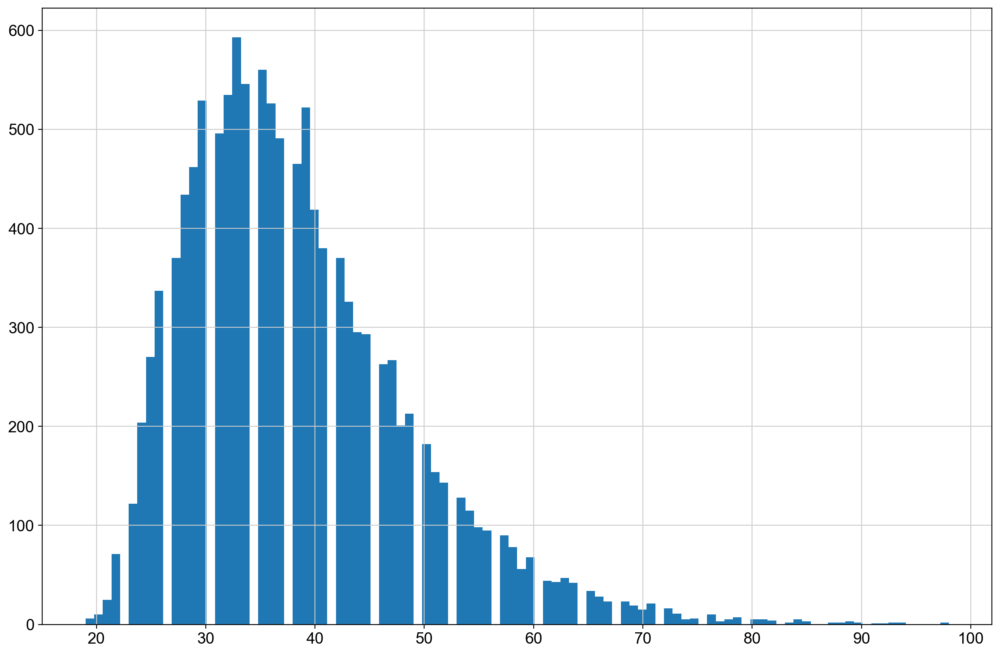

In [21]:
# visualize the distribution of neighbourhood sizes to find of the right value for k
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)

#### Count cells in neighbourhoods


In [22]:
# Specify sample column and calcuklate neighbourhood compositions
milo.count_nhoods(adata, sample_col="sample")

In [23]:
adata.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 12251 × 12
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

#### Differential abundance testing with GLM

In [24]:
#convert the "stage" to a continuous variable, to test for linear increase over time
adata.obs["stage_continuous"] = adata.obs["group"].cat.codes

In [25]:
adata.obs["stage_continuous"].value_counts()

1    26261
0    23667
Name: stage_continuous, dtype: int64

In [26]:
adata.obs["group"].value_counts()

copd_ctrl       26261
healthy_ctrl    23667
Name: group, dtype: int64

In [27]:
# Formulate the formula for the differential abundance test
milo.DA_nhoods(adata, design="~stage_continuous")

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [28]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,763870-ST07_CSE_CTRL-V1,785.191895,-1.481855,7.077109,0.798987,0.371398,0.998716,0.999633
1,192197-ST07_CSE_CTRL-V1,526.824768,-1.018164,7.123042,0.367913,0.544145,0.999118,0.999633
2,550787-ST07_CSE_CTRL-V1,431.800385,0.402608,6.953742,0.066664,0.796258,0.999118,0.999633
3,580755-ST07_CSE_CTRL-V1,615.857422,-0.366960,6.930650,0.056259,0.812509,0.999118,0.999633
4,191617-ST07_CSE_CTRL-V1,499.280304,-0.042147,7.405579,0.000532,0.981590,0.999118,0.999633
...,...,...,...,...,...,...,...,...
12246,8438090-CSE03_CTRL-V6,136.639984,0.802553,6.815365,0.286883,0.592226,0.999118,0.999633
12247,13874320-CSE03_CTRL-V6,104.376030,-0.293438,7.214949,0.029619,0.863358,0.999118,0.999633
12248,13157829-CSE03_CTRL-V6,122.593597,1.717952,6.592671,1.310536,0.252300,0.962089,0.999633
12249,12250460-CSE03_CTRL-V6,105.673431,1.184717,6.810726,0.624865,0.429247,0.999118,0.999633


#### Results visualization

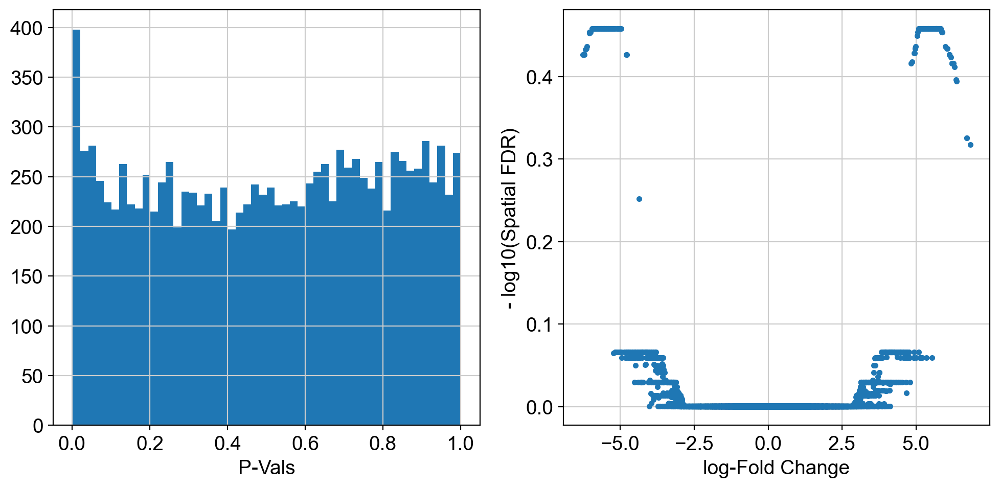

In [29]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata.uns["nhood_adata"].obs.logFC, -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [30]:
# Calculate how much cells pass the threshold FDR < 0.05 & p-value < 0.05 & logFC > 0.5
adata.uns["nhood_adata"].obs[(adata.uns["nhood_adata"].obs.SpatialFDR < 0.1) & (adata.uns["nhood_adata"].obs.PValue < 0.05) & (adata.uns["nhood_adata"].obs.logFC > 0.5)].shape[0]

0

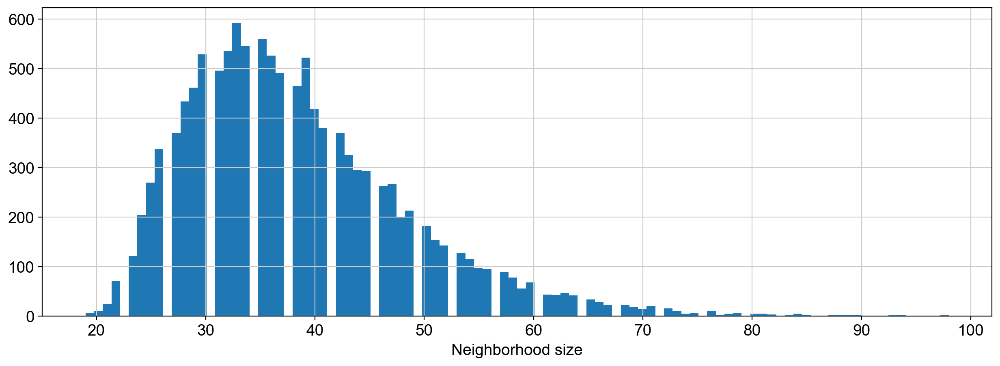

In [31]:
# Plot Neighborhood size distribution
sc.set_figure_params(figsize=(15, 5),dpi=100)
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)
plt.xlabel("Neighborhood size")
plt.show()

#### Visualize results on embedding

StopIteration: 

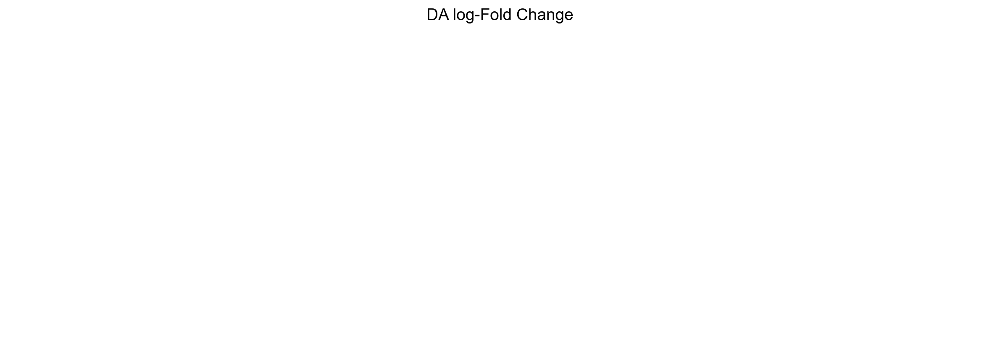

In [32]:
# Plot embedding with neighborhood graph

milopy.utils.build_nhood_graph(adata)

alpha=0.1
min_size=2
min_logFC: float = 0
plot_edges: bool = False
title: str = "DA log-Fold Change"

nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

# Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(),
                        "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values(
        'abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(),
                  abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", color="graph_color", cmap="RdBu_r", title=title, vmax=vmax, vmin=vmin,frameon=False, sort_order=False, 
edges=plot_edges, neighbors_key="nhood", size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size)

#### Visualize result by celltype

In [33]:
milopy.utils.annotate_nhoods(adata, anno_col='leiden_states')

Text(0.5, 0, 'celltype fraction')

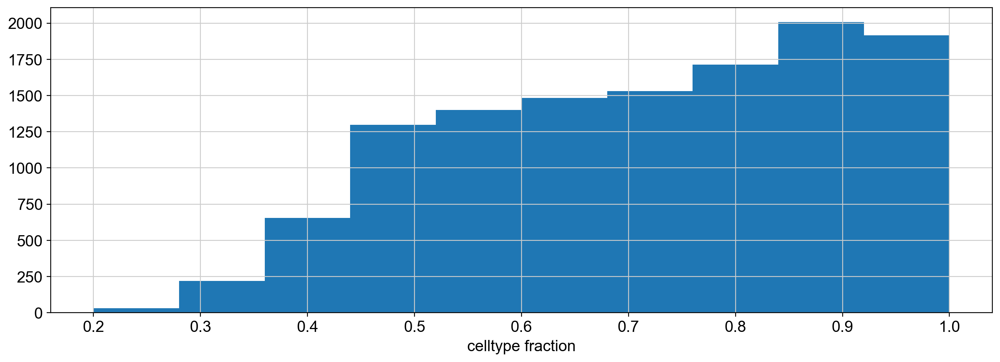

In [34]:
plt.hist(adata.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [ ]:
#adata.uns['nhood_adata'].obs.loc[adata.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

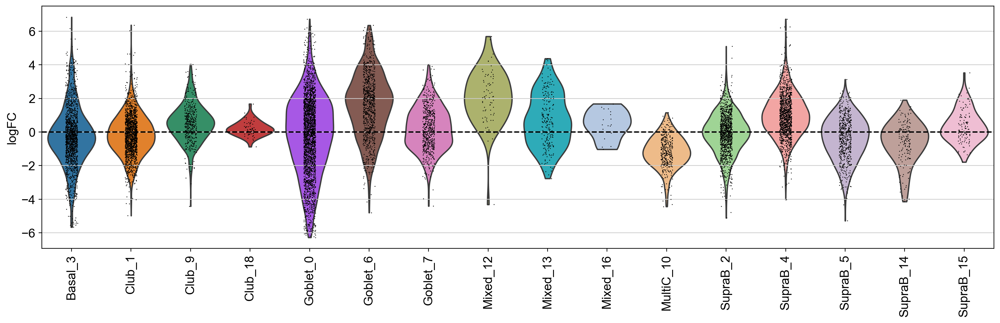

In [35]:
sc.pl.violin(adata.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()

# Healthy control vs. Influenza-infected

In [36]:
adata = adata_raw.copy()

In [37]:
# Filter only healthy_ctrl and COPD_ctrl cells
adata = adata[adata.obs['group'].isin(['healthy_ctrl', 'healthy_iav'])]

In [38]:
adata.obs['group'].value_counts()

healthy_ctrl    23667
healthy_iav     22687
Name: group, dtype: int64

In [39]:
# Calculate PCA 
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:23)


#### Build KNN graph

In [40]:
# Build a KNN graph
k = 20
d = 40

sc.pp.neighbors(adata, n_neighbors=k, n_pcs=d)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


#### Construct neighbourhoods

In [41]:
#Assign cells to a set of representative neighbourhoods on the KNN graph
milo.make_nhoods(adata, prop=0.5)

In [42]:
adata.obsm["nhoods"]

<46354x11494 sparse matrix of type '<class 'numpy.float32'>'
	with 433243 stored elements in Compressed Sparse Row format>

In [43]:
adata[adata.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

,nhood_ixs_refined,nhood_kth_distance
192197-ST07_CSE_CTRL-V1,1,484.203552
632999-ST07_CSE_CTRL-V1,1,535.742065
104170-ST07_CSE_CTRL-V1,1,506.264252
367551-ST07_CSE_CTRL-V1,1,730.917114
15014-ST07_CSE_CTRL-V1,1,581.362061
...,...,...
14029079-GER02_IAV-V6,1,164.237762
6205531-GER02_IAV-V6,1,173.350388
10502482-GER02_IAV-V6,1,194.466721
2093225-GER02_IAV-V6,1,130.924576


(array([  4.,  16.,  28.,  63., 129., 180., 237., 348., 394., 437., 462.,
          0., 506., 502., 572., 555., 552., 495., 483., 489., 469., 418.,
          0., 460., 374., 349., 307., 263., 229., 269., 216., 183., 181.,
          0., 139., 140., 115., 114.,  92., 104.,  91.,  70.,  53.,  60.,
          0.,  38.,  41.,  32.,  30.,  23.,  28.,  18.,  16.,  19.,  14.,
          0.,   8.,  14.,   4.,   9.,   8.,   6.,   7.,   2.,   7.,   1.,
          0.,   4.,   1.,   3.,   0.,   2.,   0.,   1.,   4.,   1.,   1.,
          0.,   1.,   0.,   0.,   1.,   0.,   0.,   0.,   1.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([ 19.        ,  19.90999985,  20.81999969,  21.72999954,
         22.63999939,  23.54999924,  24.45999908,  25.37000084,
         26.28000069,  27.19000053,  28.10000038,  29.01000023,
         29.92000008,  30.82999992,  31.73999977,  32.65000153,
         33.56000137,  34.47000122,  35.38000107,  36.29000092

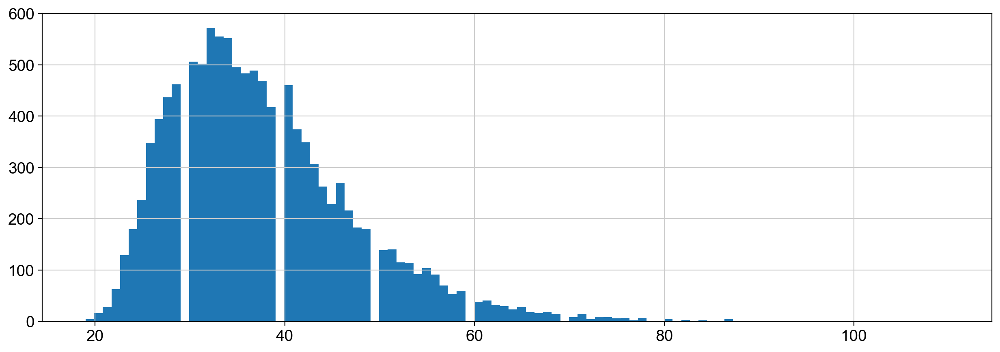

In [44]:
# visualize the distribution of neighbourhood sizes to find of the right value for k
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)

#### Count cells in neighbourhoods


In [45]:
# Specify sample column and calcuklate neighbourhood compositions
milo.count_nhoods(adata, sample_col="sample")

In [46]:
adata.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 11494 × 12
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

#### Differential abundance testing with GLM

In [47]:
#convert the "stage" to a continuous variable, to test for linear increase over time
adata.obs["stage_continuous"] = adata.obs["group"].cat.codes

In [48]:
adata.obs["stage_continuous"].value_counts()

0    23667
1    22687
Name: stage_continuous, dtype: int64

In [49]:
adata.obs["group"].value_counts()

healthy_ctrl    23667
healthy_iav     22687
Name: group, dtype: int64

In [50]:
# Formulate the formula for the differential abundance test
milo.DA_nhoods(adata, design="~stage_continuous")

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [51]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,192197-ST07_CSE_CTRL-V1,484.203552,0.514967,7.293657,0.089476,0.764845,0.999661,0.999782
1,632999-ST07_CSE_CTRL-V1,535.742065,-2.642975,7.068683,2.480738,0.115251,0.584596,0.873830
2,104170-ST07_CSE_CTRL-V1,506.264252,-2.058218,7.435523,1.201927,0.272939,0.915460,0.999782
3,367551-ST07_CSE_CTRL-V1,730.917114,-5.805921,7.157230,9.224319,0.002389,0.048706,0.081308
4,15014-ST07_CSE_CTRL-V1,581.362061,-0.500803,6.904248,0.113770,0.735893,0.999661,0.999782
...,...,...,...,...,...,...,...,...
11489,14029079-GER02_IAV-V6,164.237762,2.076846,6.899337,1.843752,0.174515,0.742640,0.999782
11490,6205531-GER02_IAV-V6,173.350388,1.150229,7.085057,0.515272,0.472867,0.999661,0.999782
11491,10502482-GER02_IAV-V6,194.466721,0.701508,7.176417,0.182200,0.669490,0.999661,0.999782
11492,2093225-GER02_IAV-V6,130.924576,0.621824,7.099468,0.153105,0.695587,0.999661,0.999782


#### Results visualization

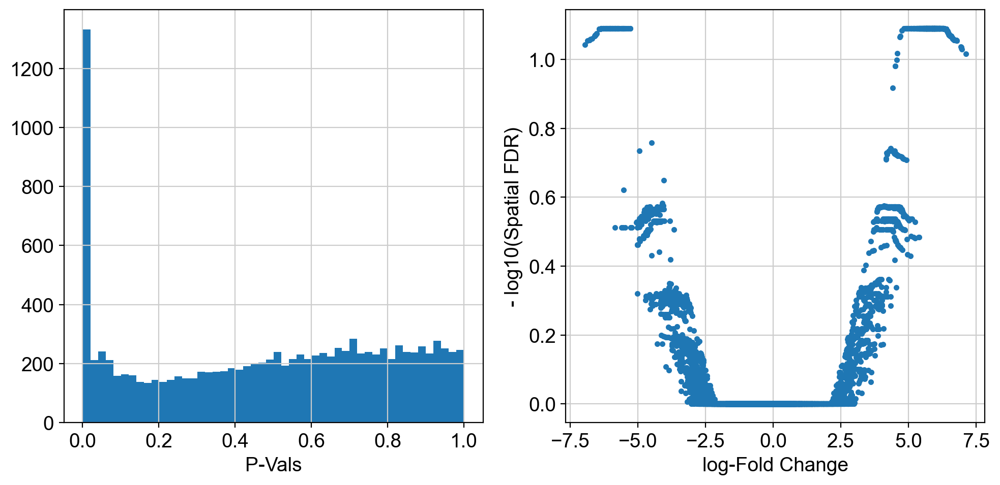

In [52]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata.uns["nhood_adata"].obs.logFC, -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [53]:
# Calculate how much cells pass the threshold FDR < 0.05 & p-value < 0.05 & logFC > 0.5
adata.uns["nhood_adata"].obs[(adata.uns["nhood_adata"].obs.SpatialFDR < 0.1) & (adata.uns["nhood_adata"].obs.PValue < 0.05) & (adata.uns["nhood_adata"].obs.logFC > 0.5)].shape[0]

874

#### Visualize results on embedding

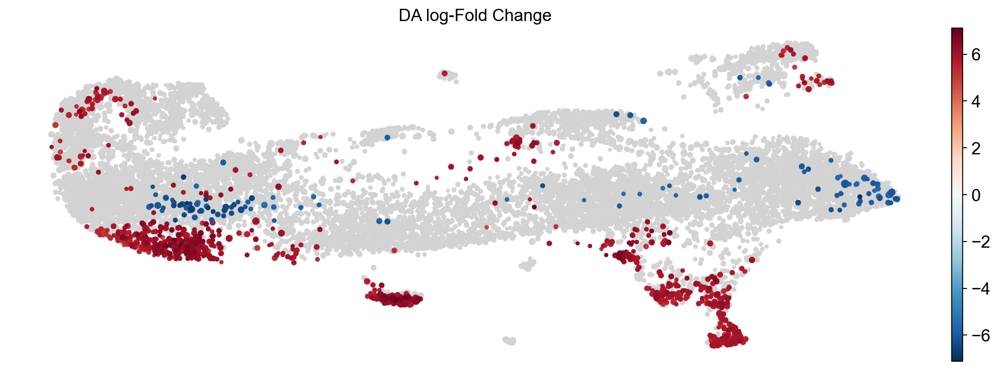

In [54]:
# Plot embedding with neighborhood graph

milopy.utils.build_nhood_graph(adata)

alpha=0.1
min_size=2
min_logFC: float = 0
plot_edges: bool = False
title: str = "DA log-Fold Change"

nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

# Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(),
                        "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values(
        'abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(),
                  abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", color="graph_color", cmap="RdBu_r", title=title, vmax=vmax, vmin=vmin,frameon=False, sort_order=False, 
edges=plot_edges, neighbors_key="nhood", size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size)

#### Visualize result by celltype

In [55]:
milopy.utils.annotate_nhoods(adata, anno_col='leiden_states')

Text(0.5, 0, 'celltype fraction')

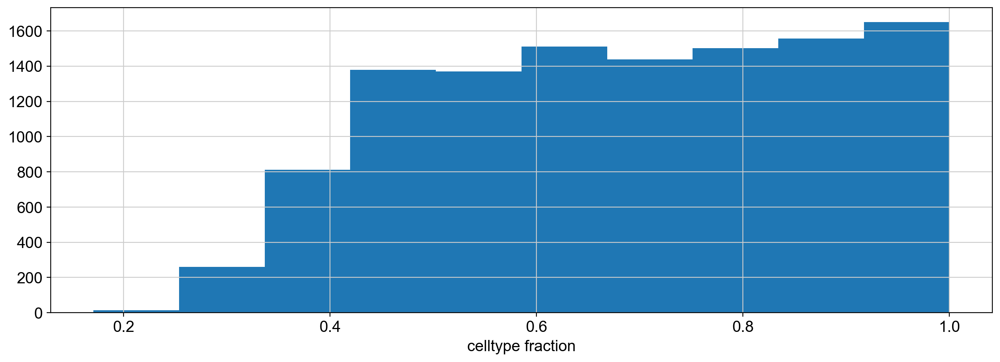

In [56]:
plt.hist(adata.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [57]:
#adata.uns['nhood_adata'].obs.loc[adata.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

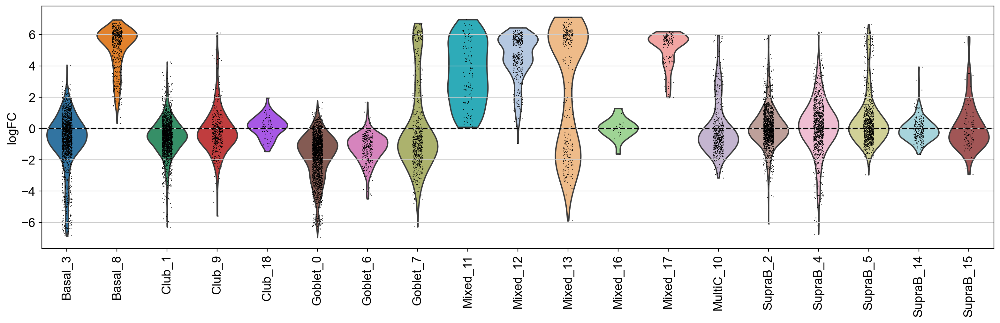

In [58]:
sc.pl.violin(adata.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()

# Healthy control vs. COPD+influenza

In [59]:
adata = adata_raw.copy()

In [60]:
# Filter only healthy_ctrl and COPD_ctrl cells
adata = adata[adata.obs['group'].isin(['healthy_ctrl', 'copd_iav'])]

In [61]:
adata.obs['group'].value_counts()

copd_iav        24958
healthy_ctrl    23667
Name: group, dtype: int64

In [62]:
# Calculate PCA 
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:23)


#### Build KNN graph

In [63]:
# Build a KNN graph
k = 20
d = 40

sc.pp.neighbors(adata, n_neighbors=k, n_pcs=d)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


#### Construct neighbourhoods

In [64]:
#Assign cells to a set of representative neighbourhoods on the KNN graph
milo.make_nhoods(adata, prop=0.5)

In [65]:
adata.obsm["nhoods"]

<48625x12146 sparse matrix of type '<class 'numpy.float32'>'
	with 460218 stored elements in Compressed Sparse Row format>

In [66]:
adata[adata.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

,nhood_ixs_refined,nhood_kth_distance
192197-ST07_CSE_CTRL-V1,1,514.020691
191617-ST07_CSE_CTRL-V1,1,498.767792
632999-ST07_CSE_CTRL-V1,1,537.878296
104170-ST07_CSE_CTRL-V1,1,504.158569
827229-ST07_CSE_CTRL-V1,1,417.598389
...,...,...
6955026-CSE03_IAV-V6,1,111.275856
12536461-CSE03_IAV-V6,1,92.730766
8274833-CSE03_IAV-V6,1,113.044128
9598877-CSE03_IAV-V6,1,90.005241


(array([  1.,  13.,  27.,  76.,   0., 111., 181., 264., 352.,   0., 398.,
        464., 516.,   0., 533., 507., 589., 566.,   0., 587., 562., 529.,
          0., 486., 499., 460., 419.,   0., 407., 348., 315.,   0., 302.,
        283., 275., 217.,   0., 213., 175., 177.,   0., 152., 125., 113.,
        106.,   0.,  98.,  83.,  78.,   0.,  73.,  57.,  47.,  55.,   0.,
         41.,  33.,  33.,  18.,   0.,  18.,  22.,  10.,   0.,  13.,  12.,
         17.,   9.,   0.,   8.,  14.,   7.,   0.,  14.,   7.,   3.,   4.,
          0.,   1.,   1.,   2.,   0.,   5.,   0.,   2.,   2.,   0.,   4.,
          0.,   0.,   0.,   3.,   2.,   0.,   0.,   0.,   0.,   0.,   1.,
          1.]),
 array([19.        , 19.78000069, 20.55999947, 21.34000015, 22.12000084,
        22.89999962, 23.68000031, 24.45999908, 25.23999977, 26.02000046,
        26.79999924, 27.57999992, 28.36000061, 29.13999939, 29.92000008,
        30.70000076, 31.47999954, 32.25999832, 33.04000092, 33.81999969,
        34.59999847, 35.38

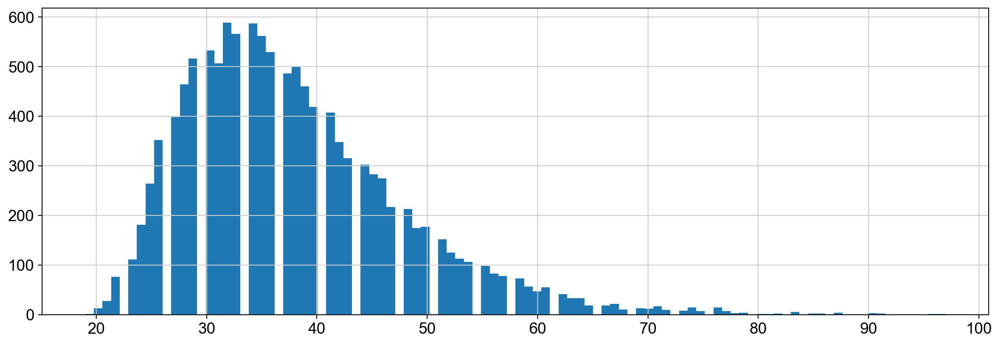

In [67]:
# visualize the distribution of neighbourhood sizes to find of the right value for k
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)

#### Count cells in neighbourhoods


In [68]:
# Specify sample column and calcuklate neighbourhood compositions
milo.count_nhoods(adata, sample_col="sample")

In [69]:
adata.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 12146 × 11
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

#### Differential abundance testing with GLM

In [70]:
#convert the "stage" to a continuous variable, to test for linear increase over time
adata.obs["stage_continuous"] = adata.obs["group"].cat.codes

In [71]:
adata.obs["stage_continuous"].value_counts()

1    24958
0    23667
Name: stage_continuous, dtype: int64

In [72]:
adata.obs["group"].value_counts()

copd_iav        24958
healthy_ctrl    23667
Name: group, dtype: int64

In [73]:
# Formulate the formula for the differential abundance test
milo.DA_nhoods(adata, design="~stage_continuous")

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [74]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,192197-ST07_CSE_CTRL-V1,514.020691,-1.137835,7.045910,0.484819,0.486249,0.779229,0.878005
1,191617-ST07_CSE_CTRL-V1,498.767792,-1.759936,6.973938,1.155967,0.282306,0.617146,0.753673
2,632999-ST07_CSE_CTRL-V1,537.878296,-1.657799,7.001490,1.006893,0.315650,0.650144,0.781333
3,104170-ST07_CSE_CTRL-V1,504.158569,-1.091715,7.232408,0.429593,0.512190,0.794617,0.886511
4,827229-ST07_CSE_CTRL-V1,417.598389,-0.613167,7.064357,0.147574,0.700865,0.893347,0.943084
...,...,...,...,...,...,...,...,...
12141,6955026-CSE03_IAV-V6,111.275856,2.081346,7.090606,1.653922,0.198429,0.536177,0.690158
12142,12536461-CSE03_IAV-V6,92.730766,1.136834,7.214469,0.504009,0.477745,0.774622,0.875980
12143,8274833-CSE03_IAV-V6,113.044128,0.741061,6.969072,0.232836,0.629430,0.863750,0.930128
12144,9598877-CSE03_IAV-V6,90.005241,-0.119446,7.250773,0.005437,0.941219,0.981730,0.987710


#### Results visualization

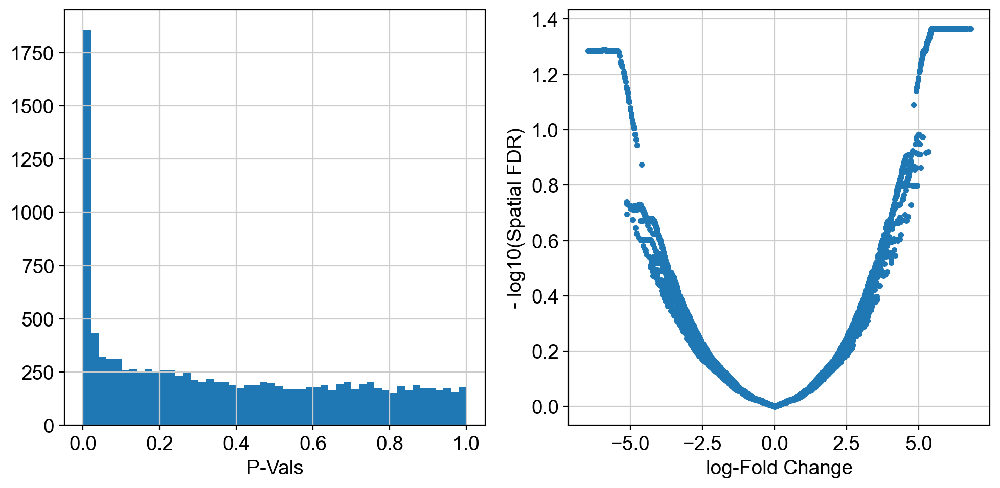

In [75]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata.uns["nhood_adata"].obs.logFC, -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [76]:
# Calculate how much cells pass the threshold FDR < 0.05 & p-value < 0.05 & logFC > 0.5
adata.uns["nhood_adata"].obs[(adata.uns["nhood_adata"].obs.SpatialFDR < 0.1) & (adata.uns["nhood_adata"].obs.PValue < 0.05) & (adata.uns["nhood_adata"].obs.logFC > 0.5)].shape[0]

1190

#### Visualize results on embedding

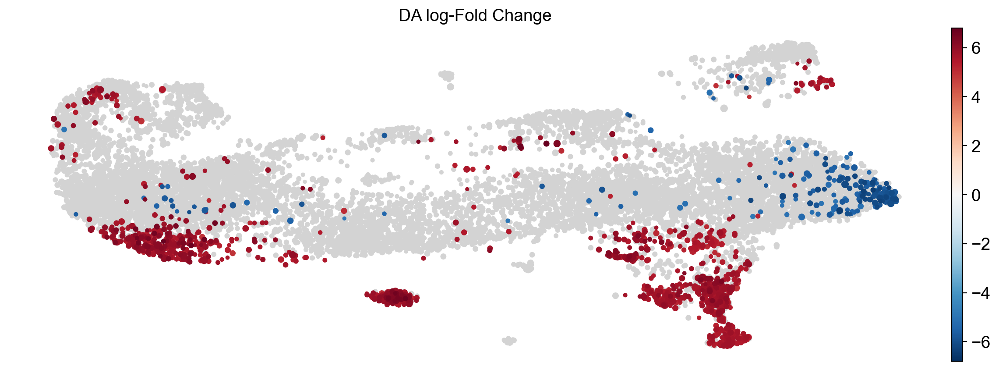

In [77]:
# Plot embedding with neighborhood graph

milopy.utils.build_nhood_graph(adata)

alpha=0.1
min_size=2
min_logFC: float = 0
plot_edges: bool = False
title: str = "DA log-Fold Change"

nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

# Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(),
                        "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values(
        'abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(),
                  abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", color="graph_color", cmap="RdBu_r", title=title, vmax=vmax, vmin=vmin,frameon=False, sort_order=False, 
edges=plot_edges, neighbors_key="nhood", size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size)

#### Visualize result by celltype

In [78]:
milopy.utils.annotate_nhoods(adata, anno_col='leiden_states')

Text(0.5, 0, 'celltype fraction')

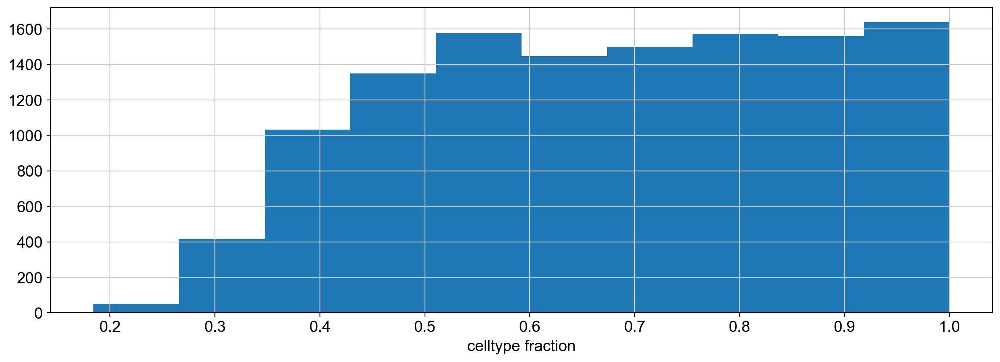

In [79]:
plt.hist(adata.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [80]:
#adata.uns['nhood_adata'].obs.loc[adata.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

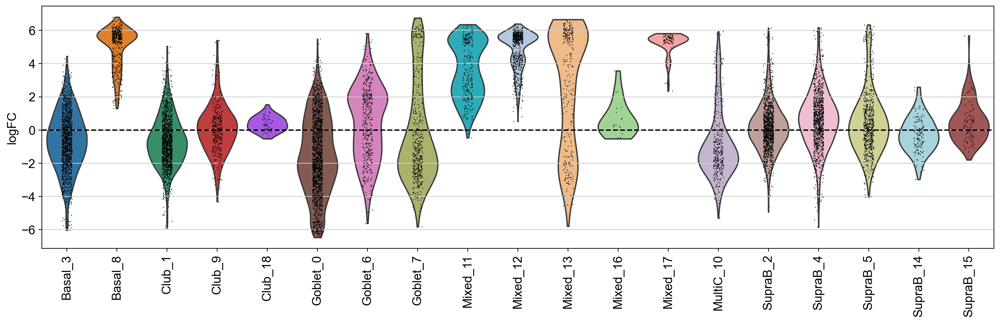

In [81]:
sc.pl.violin(adata.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()

# COPD vs. Influenza-infected

In [82]:
adata = adata_raw.copy()

In [83]:
# Filter only healthy_ctrl and COPD_ctrl cells
adata = adata[adata.obs['group'].isin(['copd_ctrl', 'healthy_iav'])]

In [84]:
adata.obs['group'].value_counts()

copd_ctrl      26261
healthy_iav    22687
Name: group, dtype: int64

In [85]:
# Calculate PCA 
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:23)


#### Build KNN graph

In [86]:
# Build a KNN graph
k = 20
d = 40

sc.pp.neighbors(adata, n_neighbors=k, n_pcs=d)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


#### Construct neighbourhoods

In [87]:
#Assign cells to a set of representative neighbourhoods on the KNN graph
milo.make_nhoods(adata, prop=0.5)

In [88]:
adata.obsm["nhoods"]

<48948x12002 sparse matrix of type '<class 'numpy.float32'>'
	with 458771 stored elements in Compressed Sparse Row format>

In [89]:
adata[adata.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

,nhood_ixs_refined,nhood_kth_distance
813402-ST08_GnR_CTRL-V1,1,535.649109
125163-ST08_GnR_CTRL-V1,1,674.635315
617083-ST08_GnR_CTRL-V1,1,857.124634
50508-ST08_GnR_CTRL-V1,1,670.925720
425906-ST08_GnR_CTRL-V1,1,473.572235
...,...,...
5178305-CSE03_CTRL-V6,1,108.551788
13874320-CSE03_CTRL-V6,1,110.118683
12250460-CSE03_CTRL-V6,1,105.625626
3863124-CSE03_CTRL-V6,1,125.104614


(array([  3.,  13.,  30.,  99.,   0., 113., 186., 237., 309.,   0., 375.,
        437., 503., 493.,   0., 498., 546., 540., 555.,   0., 546., 482.,
        510., 462.,   0., 459., 421., 413., 380.,   0., 343., 318., 261.,
        273.,   0., 213., 210., 203., 162.,   0., 187., 160., 127., 117.,
          0.,  90.,  93.,  70.,  81.,   0.,  61.,  46.,  48.,  40.,   0.,
         34.,  41.,  24.,  32.,   0.,  26.,   9.,  13.,  15.,   0.,  11.,
         15.,   8.,  14.,   0.,   9.,   4.,   4.,   5.,   0.,   2.,   2.,
          2.,   3.,   0.,   2.,   1.,   4.,   0.,   0.,   0.,   1.,   0.,
          0.,   0.,   0.,   1.,   2.,   1.,   0.,   0.,   1.,   1.,   1.,
          1.]),
 array([19.        , 19.79999924, 20.60000038, 21.39999962, 22.20000076,
        23.        , 23.79999924, 24.60000038, 25.39999962, 26.20000076,
        27.        , 27.79999924, 28.60000038, 29.39999962, 30.20000076,
        31.        , 31.79999924, 32.59999847, 33.40000153, 34.20000076,
        35.        , 35.79

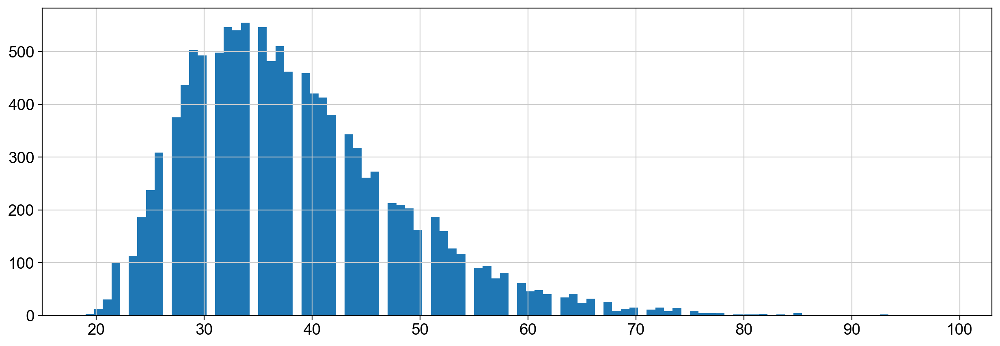

In [90]:
# visualize the distribution of neighbourhood sizes to find of the right value for k
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)

#### Count cells in neighbourhoods


In [91]:
# Specify sample column and calcuklate neighbourhood compositions
milo.count_nhoods(adata, sample_col="sample")

In [92]:
adata.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 12002 × 12
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

#### Differential abundance testing with GLM

In [93]:
#convert the "stage" to a continuous variable, to test for linear increase over time
adata.obs["stage_continuous"] = adata.obs["group"].cat.codes

In [94]:
adata.obs["stage_continuous"].value_counts()

1    26261
0    22687
Name: stage_continuous, dtype: int64

In [95]:
adata.obs["group"].value_counts()

copd_ctrl      26261
healthy_iav    22687
Name: group, dtype: int64

In [96]:
# Formulate the formula for the differential abundance test
milo.DA_nhoods(adata, design="~stage_continuous")

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [97]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,813402-ST08_GnR_CTRL-V1,535.649109,-2.728485,7.119477,2.640642,0.104164,0.352461,0.413016
1,125163-ST08_GnR_CTRL-V1,674.635315,-0.079442,6.770170,0.002721,0.958397,0.983280,0.986029
2,617083-ST08_GnR_CTRL-V1,857.124634,0.766486,6.888388,0.254151,0.614168,0.823617,0.860505
3,50508-ST08_GnR_CTRL-V1,670.925720,-3.445451,7.007219,4.255712,0.039121,0.221768,0.270638
4,425906-ST08_GnR_CTRL-V1,473.572235,-2.710969,7.360074,2.212181,0.136928,0.402598,0.466277
...,...,...,...,...,...,...,...,...
11997,5178305-CSE03_CTRL-V6,108.551788,0.628553,6.709176,0.181126,0.670408,0.853506,0.883704
11998,13874320-CSE03_CTRL-V6,110.118683,0.237050,7.069238,0.023496,0.878176,0.952052,0.962181
11999,12250460-CSE03_CTRL-V6,105.625626,2.541802,6.697667,2.606929,0.106400,0.355121,0.415002
12000,3863124-CSE03_CTRL-V6,125.104614,0.422847,6.926683,0.078511,0.779326,0.905367,0.924180


#### Results visualization

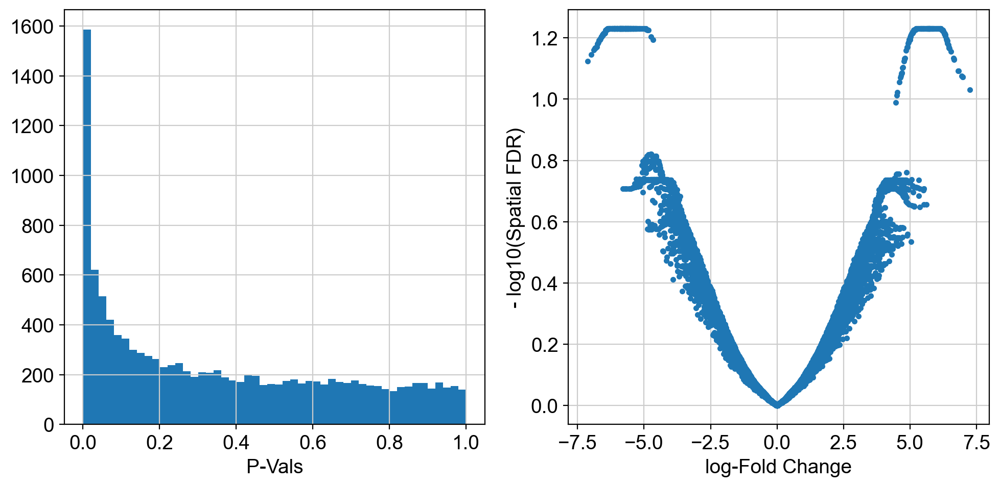

In [98]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata.uns["nhood_adata"].obs.logFC, -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [99]:
# Calculate how much cells pass the threshold FDR < 0.05 & p-value < 0.05 & logFC > 0.5
adata.uns["nhood_adata"].obs[(adata.uns["nhood_adata"].obs.SpatialFDR < 0.1) & (adata.uns["nhood_adata"].obs.PValue < 0.05) & (adata.uns["nhood_adata"].obs.logFC > 0.5)].shape[0]

294

#### Visualize results on embedding

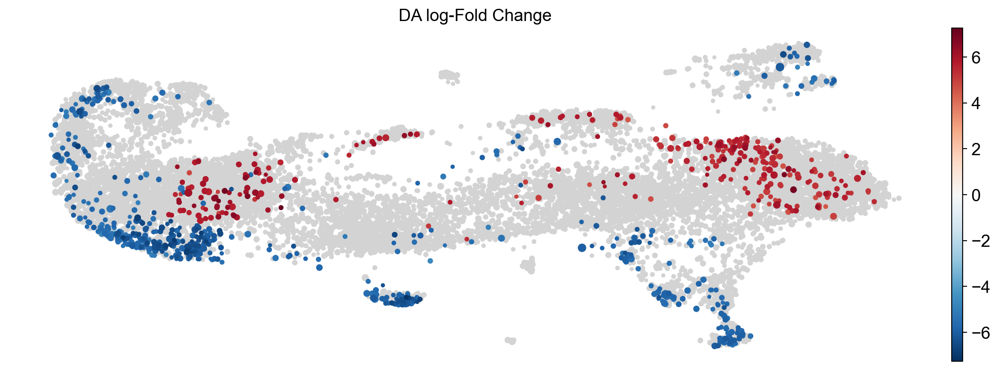

In [100]:
# Plot embedding with neighborhood graph

milopy.utils.build_nhood_graph(adata)

alpha=0.1
min_size=2
min_logFC: float = 0
plot_edges: bool = False
title: str = "DA log-Fold Change"

nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

# Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(),
                        "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values(
        'abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(),
                  abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", color="graph_color", cmap="RdBu_r", title=title, vmax=vmax, vmin=vmin,frameon=False, sort_order=False, 
edges=plot_edges, neighbors_key="nhood", size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size)

#### Visualize result by celltype

In [101]:
milopy.utils.annotate_nhoods(adata, anno_col='leiden_states')

Text(0.5, 0, 'celltype fraction')

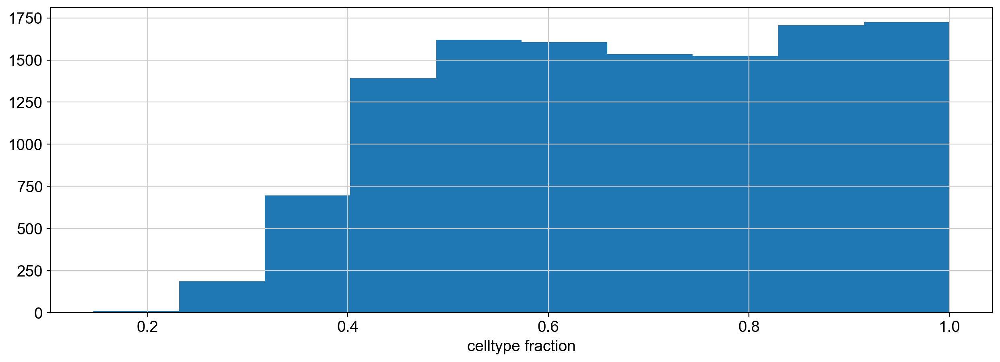

In [102]:
plt.hist(adata.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [ ]:
#adata.uns['nhood_adata'].obs.loc[adata.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

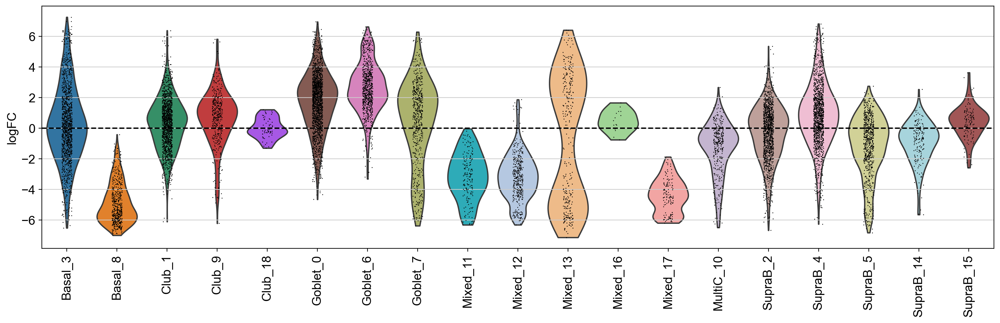

In [104]:
sc.pl.violin(adata.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()

# COPD vs. COPD+influenza

In [105]:
adata = adata_raw.copy()

In [106]:
# Filter only healthy_ctrl and COPD_ctrl cells
adata = adata[adata.obs['group'].isin(['copd_ctrl', 'copd_iav'])]

In [107]:
adata.obs['group'].value_counts()

copd_ctrl    26261
copd_iav     24958
Name: group, dtype: int64

In [108]:
# Calculate PCA 
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:25)


#### Build KNN graph

In [109]:
# Build a KNN graph
k = 20
d = 40

sc.pp.neighbors(adata, n_neighbors=k, n_pcs=d)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


#### Construct neighbourhoods

In [110]:
#Assign cells to a set of representative neighbourhoods on the KNN graph
milo.make_nhoods(adata, prop=0.5)

In [111]:
adata.obsm["nhoods"]

<51219x12469 sparse matrix of type '<class 'numpy.float32'>'
	with 478861 stored elements in Compressed Sparse Row format>

In [112]:
adata[adata.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

,nhood_ixs_refined,nhood_kth_distance
356504-ST09_CSE_IAV-V1,1,519.584045
766455-ST09_CSE_IAV-V1,1,673.110718
455939-ST09_CSE_IAV-V1,1,476.785095
233895-ST09_CSE_IAV-V1,1,480.672791
129206-ST09_CSE_IAV-V1,1,563.122742
...,...,...
5330709-CSE03_IAV-V6,1,208.804413
6653202-CSE03_IAV-V6,1,100.360970
4720207-CSE03_IAV-V6,1,117.785767
8274833-CSE03_IAV-V6,1,115.420403


(array([  4.,   8.,  38.,  62., 129., 171., 239., 338., 418.,   0., 467.,
        482., 520., 544., 527., 572., 558., 564.,   0., 519., 515., 502.,
        448., 447., 416., 396., 344.,   0., 333., 280., 276., 241., 239.,
        232., 173., 162.,   0., 152., 132., 111.,  92.,  85.,  88.,  67.,
         79.,   0.,  57.,  44.,  50.,  54.,  39.,  35.,  28.,  27.,   0.,
         21.,  14.,  14.,  22.,  13.,   7.,   9.,   9.,   0.,   8.,   7.,
          6.,   3.,   3.,   3.,   8.,   0.,   0.,   1.,   2.,   2.,   4.,
          0.,   0.,   0.,   1.,   0.,   0.,   2.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   1.,   2.,   0.,   1.,   0.,   0.,
          1.]),
 array([ 19.        ,  19.88999939,  20.78000069,  21.67000008,
         22.55999947,  23.45000076,  24.34000015,  25.22999954,
         26.12000084,  27.01000023,  27.89999962,  28.79000092,
         29.68000031,  30.56999969,  31.45999908,  32.34999847,
         33.24000168,  34.13000107,  35.02000046,  35.90999985

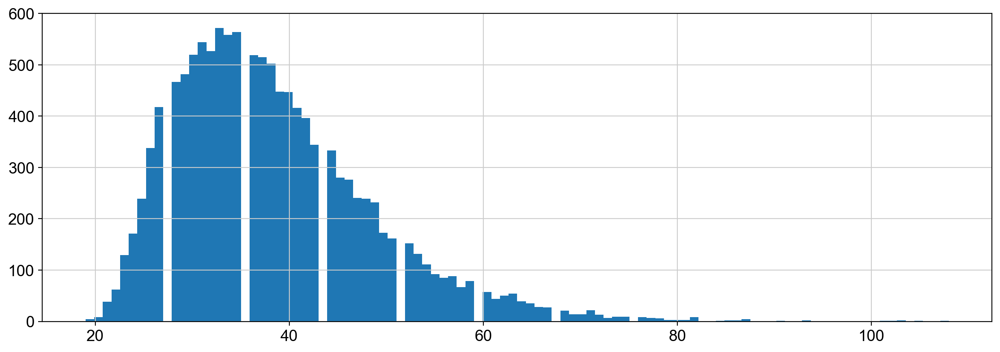

In [113]:
# visualize the distribution of neighbourhood sizes to find of the right value for k
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)

#### Count cells in neighbourhoods


In [114]:
# Specify sample column and calcuklate neighbourhood compositions
milo.count_nhoods(adata, sample_col="sample")

In [115]:
adata.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 12469 × 11
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

#### Differential abundance testing with GLM

In [116]:
#convert the "stage" to a continuous variable, to test for linear increase over time
adata.obs["stage_continuous"] = adata.obs["group"].cat.codes

In [117]:
adata.obs["stage_continuous"].value_counts()

0    26261
1    24958
Name: stage_continuous, dtype: int64

In [118]:
adata.obs["group"].value_counts()

copd_ctrl    26261
copd_iav     24958
Name: group, dtype: int64

In [119]:
# Formulate the formula for the differential abundance test
milo.DA_nhoods(adata, design="~stage_continuous")

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [120]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,356504-ST09_CSE_IAV-V1,519.584045,-0.178227,7.294910,0.008643,0.925928,0.998353,0.998829
1,766455-ST09_CSE_IAV-V1,673.110718,-0.944278,6.905057,0.336478,0.561871,0.998353,0.998829
2,455939-ST09_CSE_IAV-V1,476.785095,-1.290426,6.857121,0.649946,0.420134,0.998353,0.998829
3,233895-ST09_CSE_IAV-V1,480.672791,-0.177865,7.247466,0.009059,0.924171,0.998353,0.998829
4,129206-ST09_CSE_IAV-V1,563.122742,-0.636053,6.604897,0.175618,0.675167,0.998353,0.998829
...,...,...,...,...,...,...,...,...
12464,5330709-CSE03_IAV-V6,208.804413,1.322376,6.542576,0.756945,0.384288,0.998353,0.998829
12465,6653202-CSE03_IAV-V6,100.360970,0.378866,6.974049,0.053291,0.817433,0.998353,0.998829
12466,4720207-CSE03_IAV-V6,117.785767,0.087180,6.757973,0.003214,0.954789,0.998353,0.998829
12467,8274833-CSE03_IAV-V6,115.420403,1.592592,6.922743,0.966725,0.325500,0.998353,0.998829


#### Results visualization

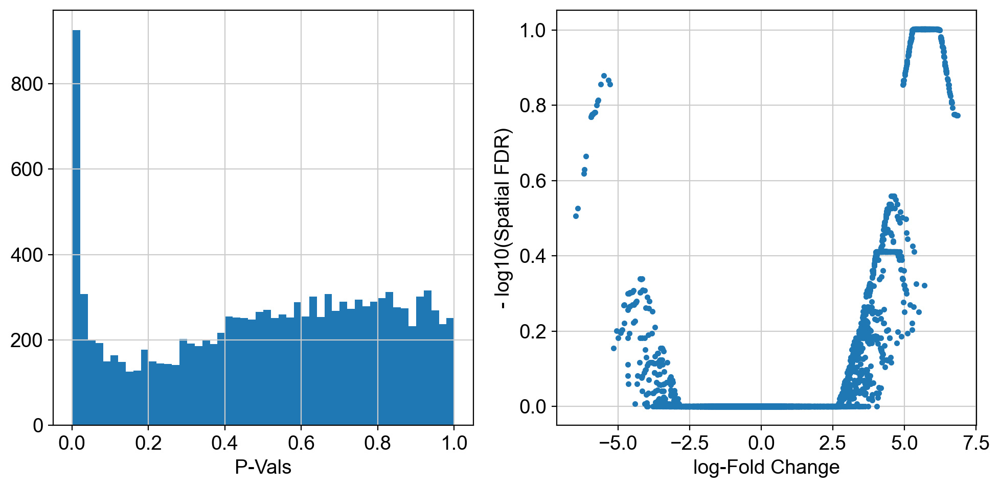

In [121]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata.uns["nhood_adata"].obs.logFC, -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [122]:
# Calculate how much cells pass the threshold FDR < 0.05 & p-value < 0.05 & logFC > 0.5
adata.uns["nhood_adata"].obs[(adata.uns["nhood_adata"].obs.SpatialFDR < 0.1) & (adata.uns["nhood_adata"].obs.PValue < 0.05) & (adata.uns["nhood_adata"].obs.logFC > 0.5)].shape[0]

440

#### Visualize results on embedding

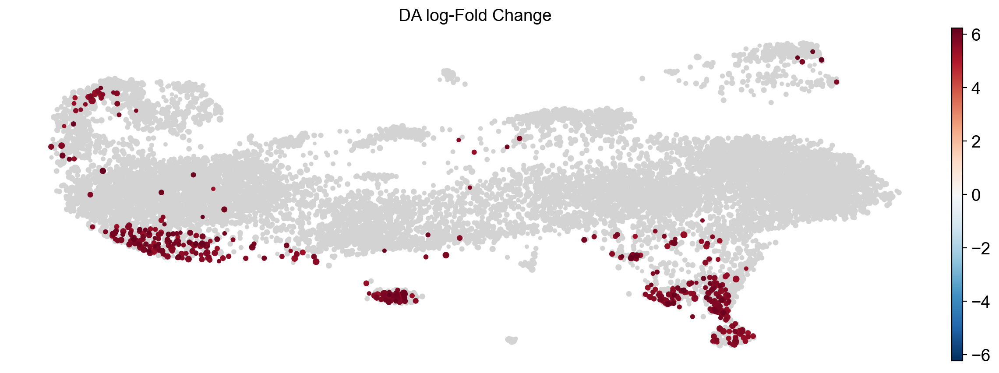

In [123]:
# Plot embedding with neighborhood graph

milopy.utils.build_nhood_graph(adata)

alpha=0.1
min_size=2
min_logFC: float = 0
plot_edges: bool = False
title: str = "DA log-Fold Change"

nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

# Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(),
                        "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values(
        'abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(),
                  abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", color="graph_color", cmap="RdBu_r", title=title, vmax=vmax, vmin=vmin,frameon=False, sort_order=False, 
edges=plot_edges, neighbors_key="nhood", size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size)

#### Visualize result by celltype

In [124]:
milopy.utils.annotate_nhoods(adata, anno_col='leiden_states')

Text(0.5, 0, 'celltype fraction')

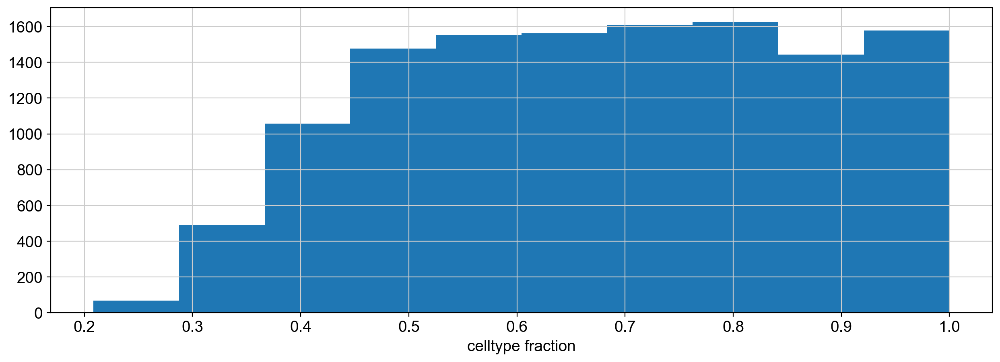

In [125]:
plt.hist(adata.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [ ]:
#adata.uns['nhood_adata'].obs.loc[adata.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

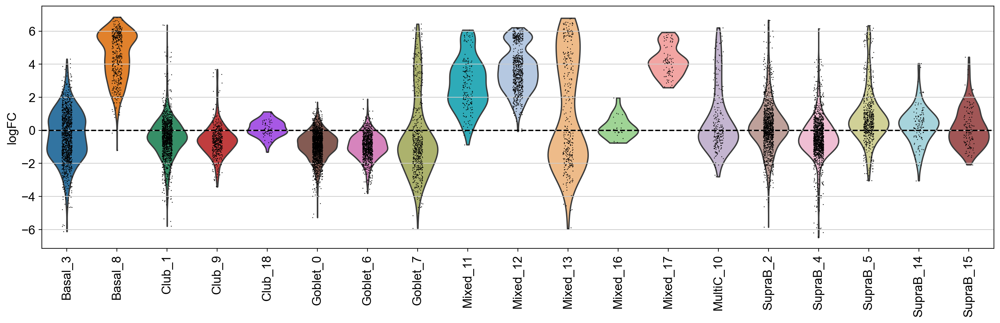

In [126]:
sc.pl.violin(adata.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()

# Influenza-infected vs. COPD+influenza

In [128]:
adata = adata_raw.copy()

In [129]:
# Filter only healthy_iav and COPD_iav cells
adata = adata[adata.obs['group'].isin(['healthy_iav', 'copd_iav'])]

In [130]:
adata.obs['group'].value_counts()

copd_iav       24958
healthy_iav    22687
Name: group, dtype: int64

In [131]:
# Calculate PCA 
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:21)


#### Build KNN graph

In [132]:
# Build a KNN graph
k = 20
d = 40

sc.pp.neighbors(adata, n_neighbors=k, n_pcs=d)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


#### Construct neighbourhoods

In [133]:
#Assign cells to a set of representative neighbourhoods on the KNN graph
milo.make_nhoods(adata, prop=0.5)

In [134]:
adata.obsm["nhoods"]

<47645x11813 sparse matrix of type '<class 'numpy.float32'>'
	with 449629 stored elements in Compressed Sparse Row format>

In [135]:
adata[adata.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

,nhood_ixs_refined,nhood_kth_distance
47453-ST08_GnR_CTRL-V1,1,540.909058
871779-ST08_GnR_CTRL-V1,1,926.313110
813402-ST08_GnR_CTRL-V1,1,535.287598
249139-ST08_GnR_CTRL-V1,1,603.280212
125163-ST08_GnR_CTRL-V1,1,688.491577
...,...,...
12536461-CSE03_IAV-V6,1,88.130875
8274833-CSE03_IAV-V6,1,115.757385
9598877-CSE03_IAV-V6,1,95.171600
7817184-CSE03_IAV-V6,1,244.260620


(array([  2.,  14.,  29.,  75., 121.,   0., 162., 247., 305., 368., 407.,
          0., 539., 497., 536., 563.,   0., 541., 573., 568., 485., 484.,
          0., 477., 448., 411., 377.,   0., 319., 321., 329., 257., 232.,
          0., 248., 220., 183., 170.,   0., 136., 140., 133., 109., 100.,
          0.,  77.,  73.,  54.,  69.,   0.,  48.,  43.,  45.,  34.,  26.,
          0.,  20.,  29.,  15.,  24.,  16.,   0.,  12.,  20.,  13.,   6.,
          0.,   7.,   5.,   7.,   4.,   5.,   0.,   6.,   3.,   2.,   3.,
          0.,   3.,   2.,   1.,   2.,   8.,   0.,   0.,   0.,   2.,   1.,
          0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([ 19.        ,  19.81999969,  20.63999939,  21.45999908,
         22.28000069,  23.10000038,  23.92000008,  24.73999977,
         25.55999947,  26.37999916,  27.20000076,  28.02000046,
         28.84000015,  29.65999985,  30.47999954,  31.29999924,
         32.11999893,  32.93999863,  33.75999832,  34.58000183

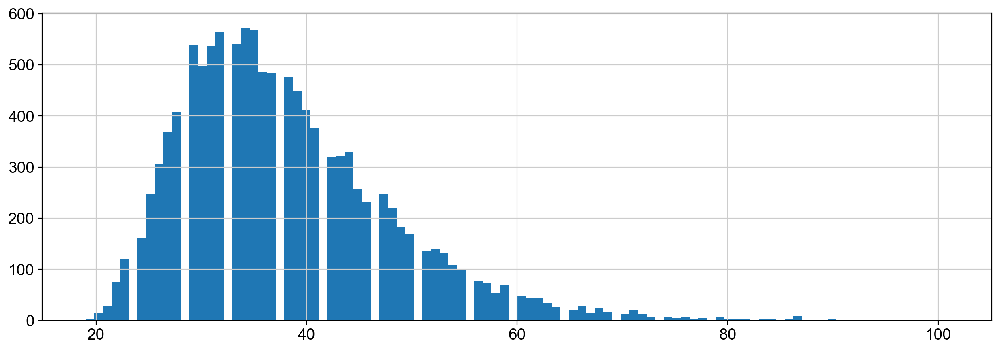

In [136]:
# visualize the distribution of neighbourhood sizes to find of the right value for k
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)

#### Count cells in neighbourhoods


In [137]:
# Specify sample column and calcuklate neighbourhood compositions
milo.count_nhoods(adata, sample_col="sample")

In [138]:
adata.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 11813 × 11
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

#### Differential abundance testing with GLM

In [139]:
#convert the "stage" to a continuous variable, to test for linear increase over time
adata.obs["stage_continuous"] = adata.obs["group"].cat.codes

In [140]:
adata.obs["stage_continuous"].value_counts()

1    24958
0    22687
Name: stage_continuous, dtype: int64

In [141]:
adata.obs["group"].value_counts()

copd_iav       24958
healthy_iav    22687
Name: group, dtype: int64

In [142]:
# Formulate the formula for the differential abundance test
milo.DA_nhoods(adata, design="~stage_continuous")

/Users/anna.maguza/miniconda3/envs/milo_env/lib/python3.9/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [143]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,47453-ST08_GnR_CTRL-V1,540.909058,-0.033797,6.814509,0.000598,0.980484,0.999847,0.999883
1,871779-ST08_GnR_CTRL-V1,926.313110,-0.614948,7.043917,0.146878,0.701538,0.999847,0.999883
2,813402-ST08_GnR_CTRL-V1,535.287598,-1.634085,7.336740,0.808325,0.368618,0.999847,0.999883
3,249139-ST08_GnR_CTRL-V1,603.280212,0.047902,6.938101,0.000883,0.976293,0.999847,0.999883
4,125163-ST08_GnR_CTRL-V1,688.491577,0.047397,6.999857,0.000934,0.975625,0.999847,0.999883
...,...,...,...,...,...,...,...,...
11808,12536461-CSE03_IAV-V6,88.130875,0.937552,7.300452,0.304220,0.581250,0.999847,0.999883
11809,8274833-CSE03_IAV-V6,115.757385,1.749549,7.070836,1.174303,0.278521,0.999847,0.999883
11810,9598877-CSE03_IAV-V6,95.171600,1.577160,7.000390,1.024152,0.311539,0.999847,0.999883
11811,7817184-CSE03_IAV-V6,244.260620,2.366451,6.576704,2.203174,0.137730,0.999847,0.999883


#### Results visualization

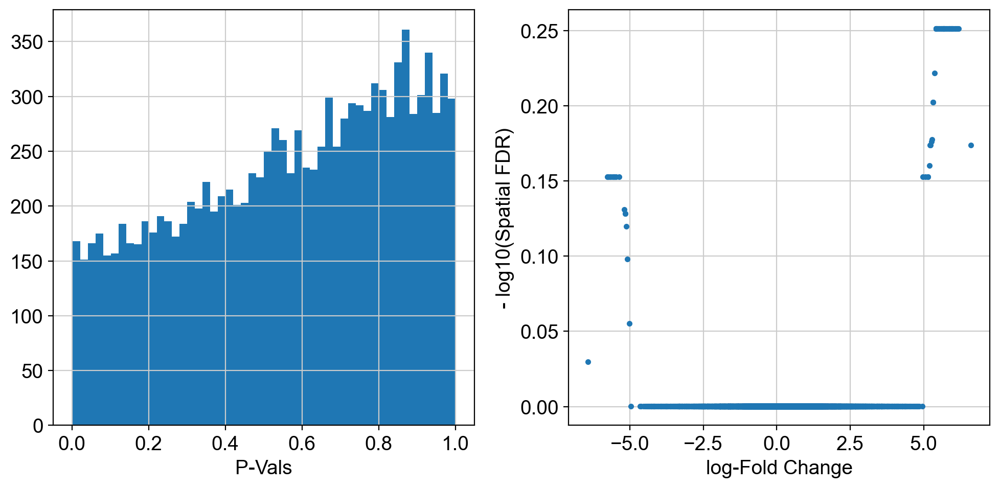

In [144]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata.uns["nhood_adata"].obs.logFC, -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [145]:
# Calculate how much cells pass the threshold FDR < 0.05 & p-value < 0.05 & logFC > 0.5
adata.uns["nhood_adata"].obs[(adata.uns["nhood_adata"].obs.SpatialFDR < 0.1) & (adata.uns["nhood_adata"].obs.PValue < 0.05) & (adata.uns["nhood_adata"].obs.logFC > 0.5)].shape[0]

0

#### Visualize results on embedding

StopIteration: 

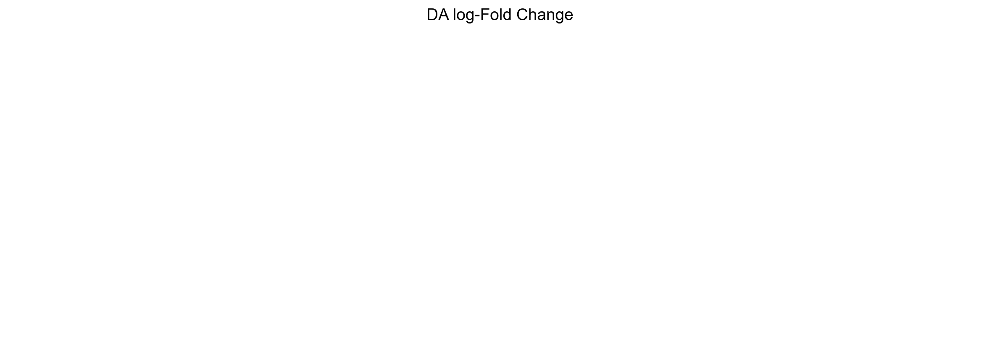

In [146]:
# Plot embedding with neighborhood graph

milopy.utils.build_nhood_graph(adata)

alpha=0.1
min_size=2
min_logFC: float = 0
plot_edges: bool = False
title: str = "DA log-Fold Change"

nhood_adata = adata.uns["nhood_adata"].copy()
nhood_adata.obs["graph_color"] = nhood_adata.obs["logFC"]
nhood_adata.obs.loc[nhood_adata.obs["SpatialFDR"] > alpha, "graph_color"] = np.nan
nhood_adata.obs["abs_logFC"] = abs(nhood_adata.obs["logFC"])
nhood_adata.obs.loc[nhood_adata.obs["abs_logFC"] < min_logFC, "graph_color"] = np.nan

# Plotting order - extreme logFC on top
nhood_adata.obs.loc[nhood_adata.obs["graph_color"].isna(),
                        "abs_logFC"] = np.nan
ordered = nhood_adata.obs.sort_values(
        'abs_logFC', na_position='first').index
nhood_adata = nhood_adata[ordered]

vmax = np.max([nhood_adata.obs["graph_color"].max(),
                  abs(nhood_adata.obs["graph_color"].min())])
vmin = - vmax

sc.pl.embedding(nhood_adata, "X_milo_graph", color="graph_color", cmap="RdBu_r", title=title, vmax=vmax, vmin=vmin,frameon=False, sort_order=False, 
edges=plot_edges, neighbors_key="nhood", size=adata.uns["nhood_adata"].obs["Nhood_size"]*min_size)

#### Visualize result by celltype

In [147]:
milopy.utils.annotate_nhoods(adata, anno_col='leiden_states')

Text(0.5, 0, 'celltype fraction')

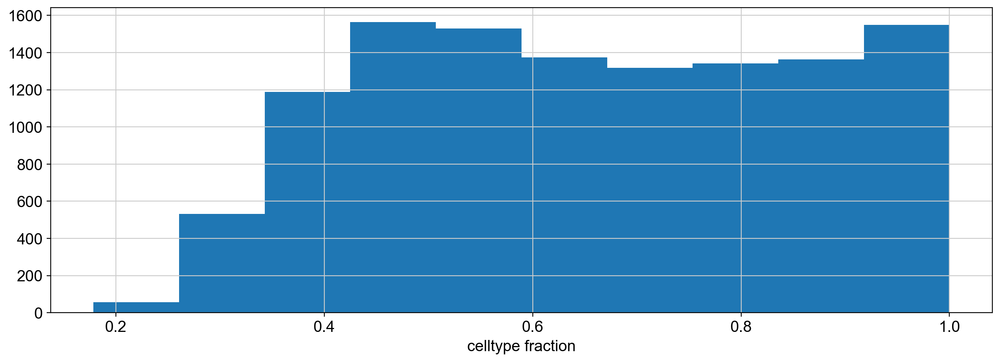

In [148]:
plt.hist(adata.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [ ]:
#adata.uns['nhood_adata'].obs.loc[adata.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

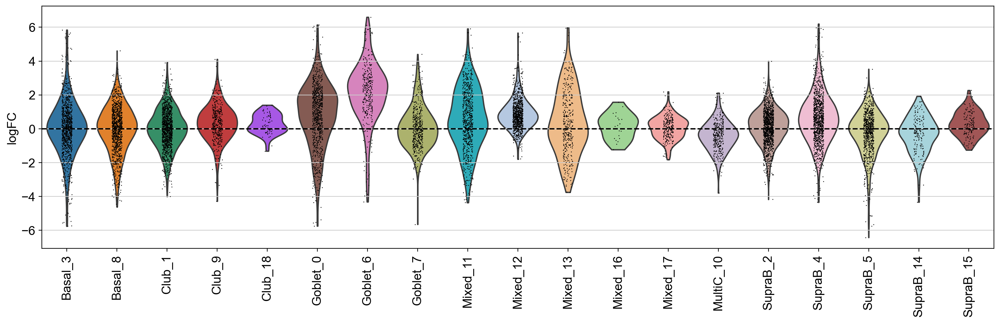

In [149]:
sc.pl.violin(adata.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()